# Trabalho de ICD: UAP(Fenômenos Anômalos Não Identificados)
*Professor: Yuri Malheiros Alunos: Vitoria, Simplicio, Daiellem, Bruno*
### Parte 3.1:

Vamos continuar as apresentações dos graficos, o nosso dataframe para esse notebook é o 2º, esse notebook conta com 70 anos de dados ele é enorme

In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import plotly.graph_objects as go
import plotly.express as px

In [3]:
sns.color_palette("RdPu")

[(0.9916493656286044, 0.8647289504036909, 0.8519492502883507),
 (0.9859592464436755, 0.7293041138023837, 0.7404229142637447),
 (0.9754555940023067, 0.5330257593233372, 0.6768935024990388),
 (0.9094502114571319, 0.2894886582083814, 0.6086120722798923),
 (0.735840061514802, 0.06196078431372548, 0.5225682429834679),
 (0.5048212226066897, 0.00392156862745098, 0.47021914648212226)]

In [22]:
df2 = pd.read_csv("./df2.csv", low_memory=False)

In [23]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80332 entries, 0 to 80331
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unnamed: 0                       80332 non-null  int64  
 1   city                             80332 non-null  object 
 2   state/province                   74535 non-null  object 
 3   country                          70662 non-null  object 
 4   UFO_shape                        78400 non-null  object 
 5   length_of_encounter_seconds      80332 non-null  object 
 6   described_duration_of_encounter  80332 non-null  object 
 7   description                      80317 non-null  object 
 8   date_documented                  80332 non-null  object 
 9   latitude                         80332 non-null  float64
 10  longitude                        80332 non-null  float64
 11  year                             80332 non-null  int64  
 12  month             

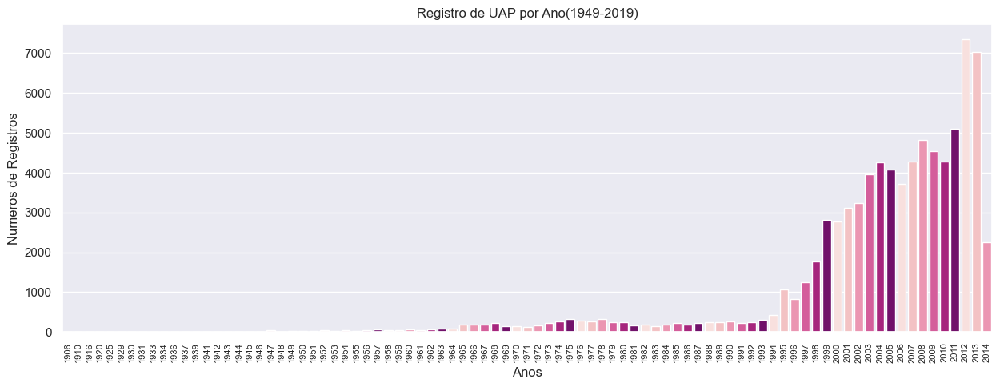

In [13]:
plt.figure(figsize=(15,5))
sns.barplot(x= df2.value_counts(df2["year"]).index, y = df2.value_counts(df2["year"]).values, palette = sns.color_palette("RdPu"))
plt.xlabel('Anos')
plt.xticks(fontsize=8)
plt.xticks(rotation=90);
plt.ylabel('Numeros de Registros')
plt.title('Registro de UAP por Ano(1949-2019)');

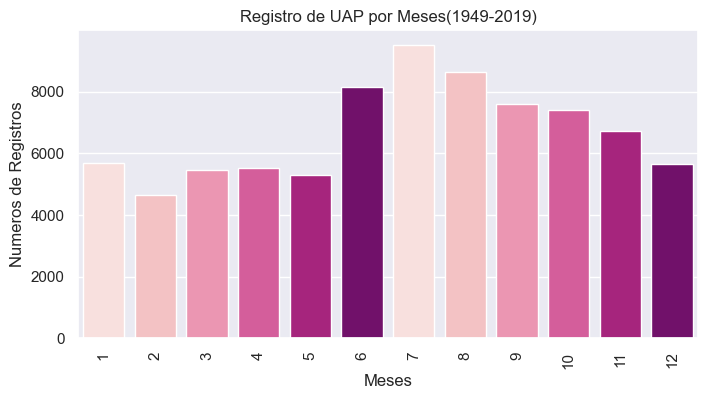

In [16]:
plt.figure(figsize=(8,4))
sns.barplot(x= df2.value_counts(df2["month"]).index, y = df2.value_counts(df2["month"]).values, palette = sns.color_palette("RdPu"))
plt.xlabel('Meses')
plt.xticks(rotation=90);
plt.ylabel('Numeros de Registros')
plt.title('Registro de UAP por Meses(1949-2019)');

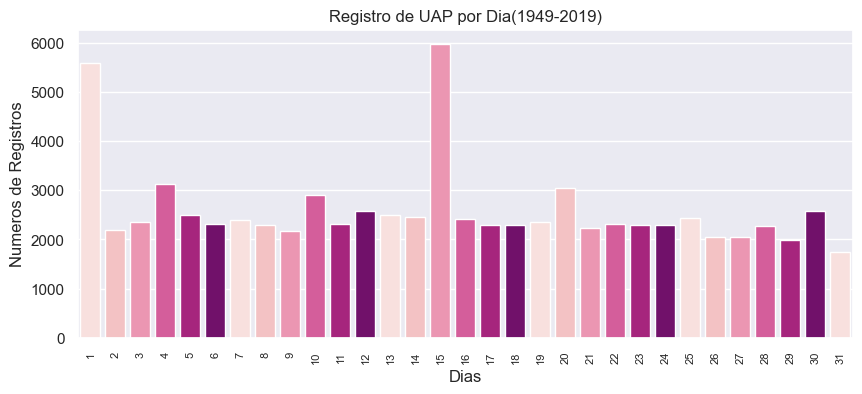

In [18]:
plt.figure(figsize=(10,4))
sns.barplot(x= df2.value_counts(df2["day"]).index, y = df2.value_counts(df2["day"]).values, palette = sns.color_palette("RdPu"))
plt.xlabel('Dias')
plt.xticks(fontsize=8)
plt.xticks(rotation=90);
plt.ylabel('Numeros de Registros')
plt.title('Registro de UAP por Dia(1949-2019)');

Text(0, 0.5, 'Registros de UAP')

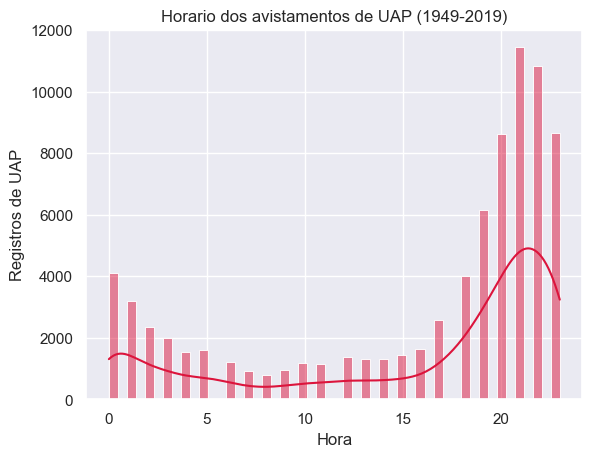

In [19]:
sns.histplot(df2['hour'], kde = 'True', color="crimson")
plt.title('Horario dos avistamentos de UAP (1949-2019)')
plt.xlabel('Hora')
plt.ylabel('Registros de UAP')

Usamos o countplox pela mesma justificativa do outro notebook 

(-0.5, 9.5)

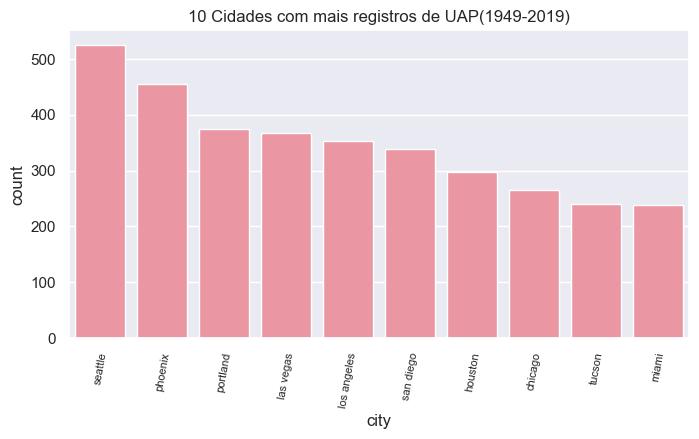

In [31]:
plt.figure(figsize=(8,4))
plt.xticks(fontsize=8)
plt.xticks(rotation=80)
plt.title('10 Cidades com mais registros de UAP(1949-2019)')
sns.countplot(x='city',order=df2['city'].value_counts().index,data=df2)
plt.xlim(-0.5,9.5)

(-0.5, 9.5)

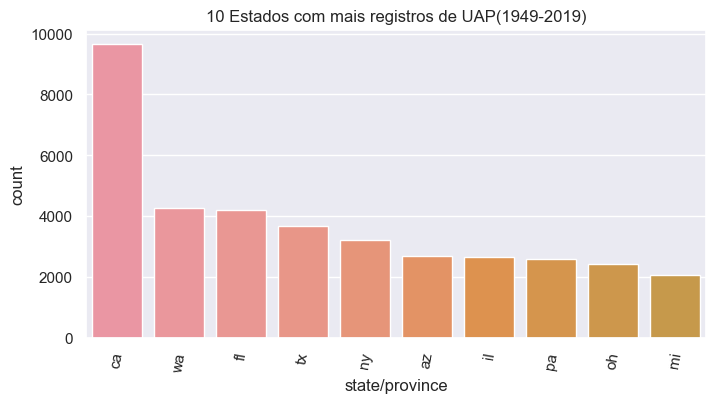

In [17]:
plt.figure(figsize=(8,4))
plt.xticks(rotation=80)
plt.title('10 Estados com mais registros de UAP(1949-2019)')
sns.countplot(x='state/province',order=df2['state/province'].value_counts().index,data=df2)
plt.xlim(-0.5,9.5)

In [9]:
df2[['country']].describe()

,country
count,70662
unique,5
top,us
freq,65114


Aqui nos temos apenas 5 valores diferentes, com uma frquencia bem alta de 65.114. É possivel tambem observar que das 80.332, 70.662 tem valores de países, ou seja, em 9.670 aparições não foi especificado o País.

Vamos utilizar o grafico de pizza para visualizar melhores esses dados

Text(0.5, 1.0, 'Frequência de UAP por Países(1949-2019')

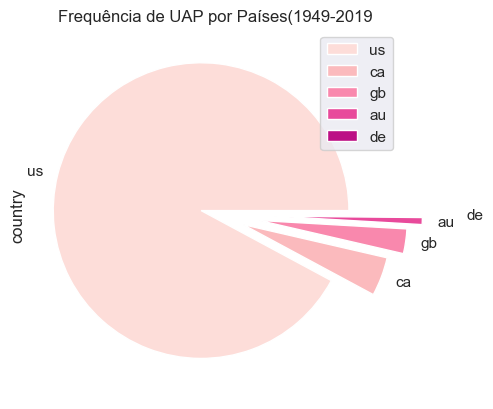

In [9]:
freqPais = df2['country'].value_counts()
freqPais.plot.pie(legend= True, explode=(0.1, 0.2, 0.3, 0.4, 0.6), colors= sns.color_palette("RdPu")).set_title('Frequência de UAP por Países(1949-2019')

Pelo grafico desse dataframe observamos que as aparições são mais vistas no Estados Unidos(us), seguido de Canadá(ca), Reino Unido(gb), Australia(au) e Alemanha(de).

A seguir vamos visualizar as caracteristicas morfologicas dos UAP:

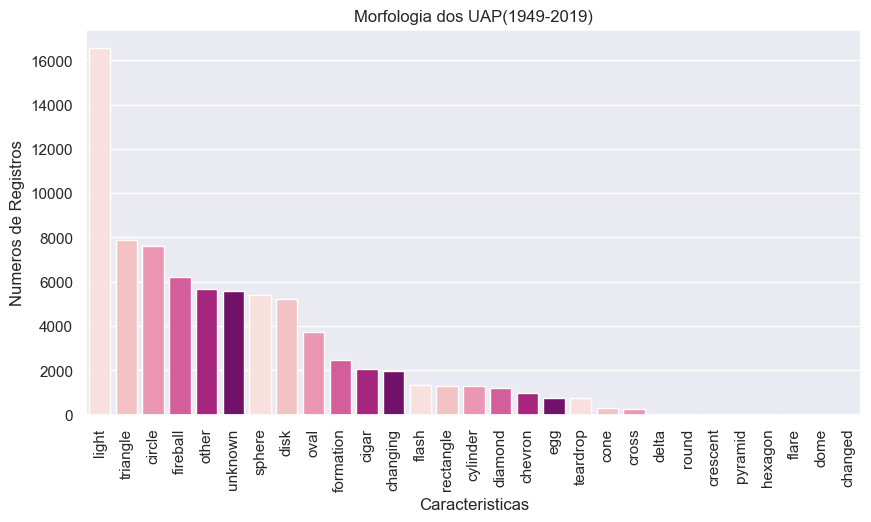

In [11]:
plt.figure(figsize=(10,5))
sns.barplot(x= df2.value_counts(df2["UFO_shape"]).index, y = df2.value_counts(df2["UFO_shape"]).values, palette = sns.color_palette("RdPu"))
plt.xlabel('Caracteristicas')
plt.xticks(rotation=90);
plt.ylabel('Numeros de Registros')
plt.title('Morfologia dos UAP(1949-2019)');

Agora vem a parte mais legal. Vamos usar um grafico de disperção para fazer o mapa com as cidades das aparições usando os dados de latitude e longitude.

In [24]:
fig = px.scatter_mapbox(df2, lat="latitude", lon="longitude", hover_name="city", hover_data=["country", "year"], color_discrete_sequence=["violet"], zoom=0.5, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()